**Lab - 5: Semantic Segmentation ด้วย SAM และแผนที่ดาวเทียม**

หัวข้อ: การแยกวัตถุจากภาพถ่ายดาวเทียมโดยใช้ Segment Anything Model (SAM) ร่วมกับข้อมูลเชิงพื้นที่

## Install dependencies

Uncomment and run the following cell to install the required dependencies.

In [ ]:
%pip install segment-geospatial

In [ ]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff

## Create an interactive map

In [ ]:
m = leafmap.Map(center=[14.81942757627406, 100.45783996010292], zoom=16, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[14.81942757627406, 100.45783996010292], controls=(ZoomControl(options=['position', 'zoom_in_text',…


Pan and zoom the map to select the area of interest. Use the draw tools to draw a polygon or rectangle on the map

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [100.44783996, 14.82942758, 100.46783996, 14.80942758]

## Download a sample image

In [ ]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

Downloaded image 01/72
Downloaded image 02/72
Downloaded image 03/72
Downloaded image 04/72
Downloaded image 05/72
Downloaded image 06/72
Downloaded image 07/72
Downloaded image 08/72
Downloaded image 09/72
Downloaded image 10/72
Downloaded image 11/72
Downloaded image 12/72
Downloaded image 13/72
Downloaded image 14/72
Downloaded image 15/72
Downloaded image 16/72
Downloaded image 17/72
Downloaded image 18/72
Downloaded image 19/72
Downloaded image 20/72
Downloaded image 21/72
Downloaded image 22/72
Downloaded image 23/72
Downloaded image 24/72
Downloaded image 25/72
Downloaded image 26/72
Downloaded image 27/72
Downloaded image 28/72
Downloaded image 29/72
Downloaded image 30/72
Downloaded image 31/72
Downloaded image 32/72
Downloaded image 33/72
Downloaded image 34/72
Downloaded image 35/72
Downloaded image 36/72
Downloaded image 37/72
Downloaded image 38/72
Downloaded image 39/72
Downloaded image 40/72
Downloaded image 41/72
Downloaded image 42/72
Downloaded image 43/72
Downloaded 

You can also use your own image. Uncomment and run the following cell to use your own image.

In [ ]:
 #image = '/content/6348f38739ec3b000787e316.tif'

Display the downloaded image on the map.

In [ ]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=7690541.0, center=[14.819428, 100.45784], controls=(ZoomControl(options=['position', 'zoom_in_text'…

## Initialize SAM class

Specify the file path to the model checkpoint. If it is not specified, the model will to downloaded to the working directory.

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:12<00:00, 207MB/s]


## Automatic mask generation

Segment the image and save the results to a GeoTIFF file. Set `unique=True` to assign a unique ID to each object.

In [ ]:

sam.generate(image, output="masks.tif", foreground=True, unique=True)


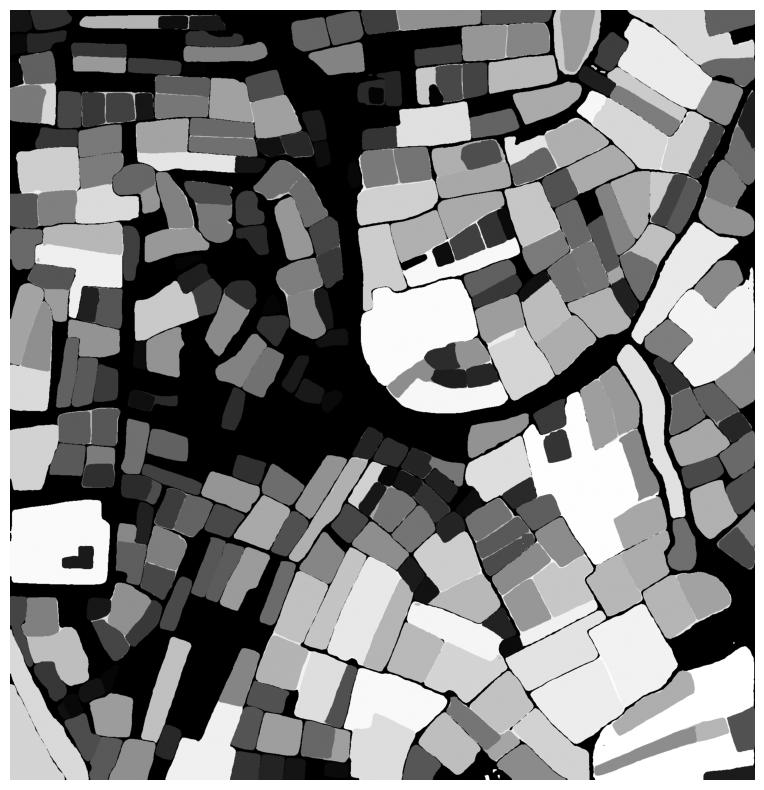

In [ ]:
sam.show_masks(cmap="binary_r")

Show the object annotations (objects with random color) on the map.

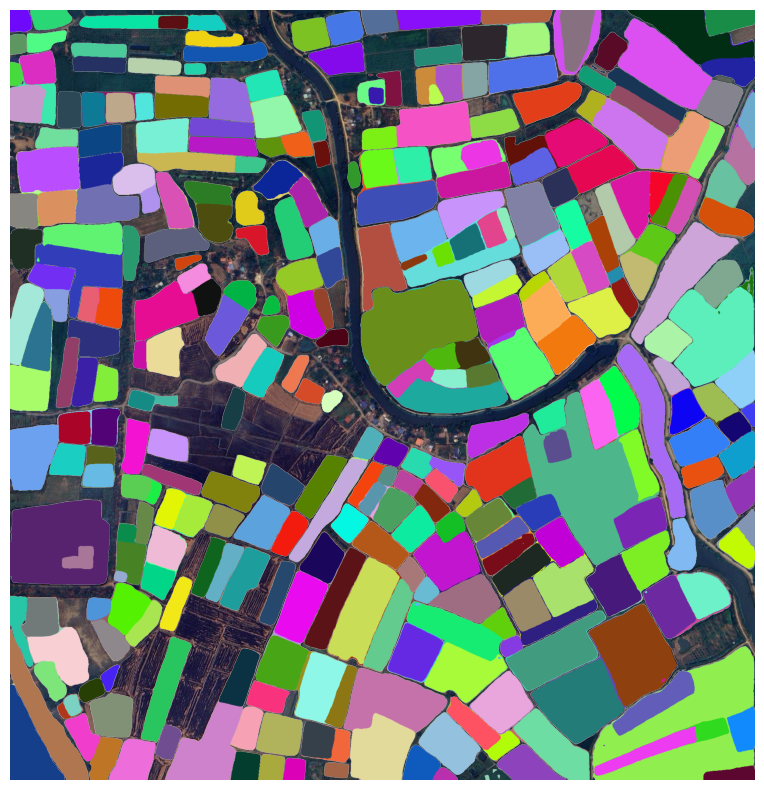

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

Compare images with a slider.


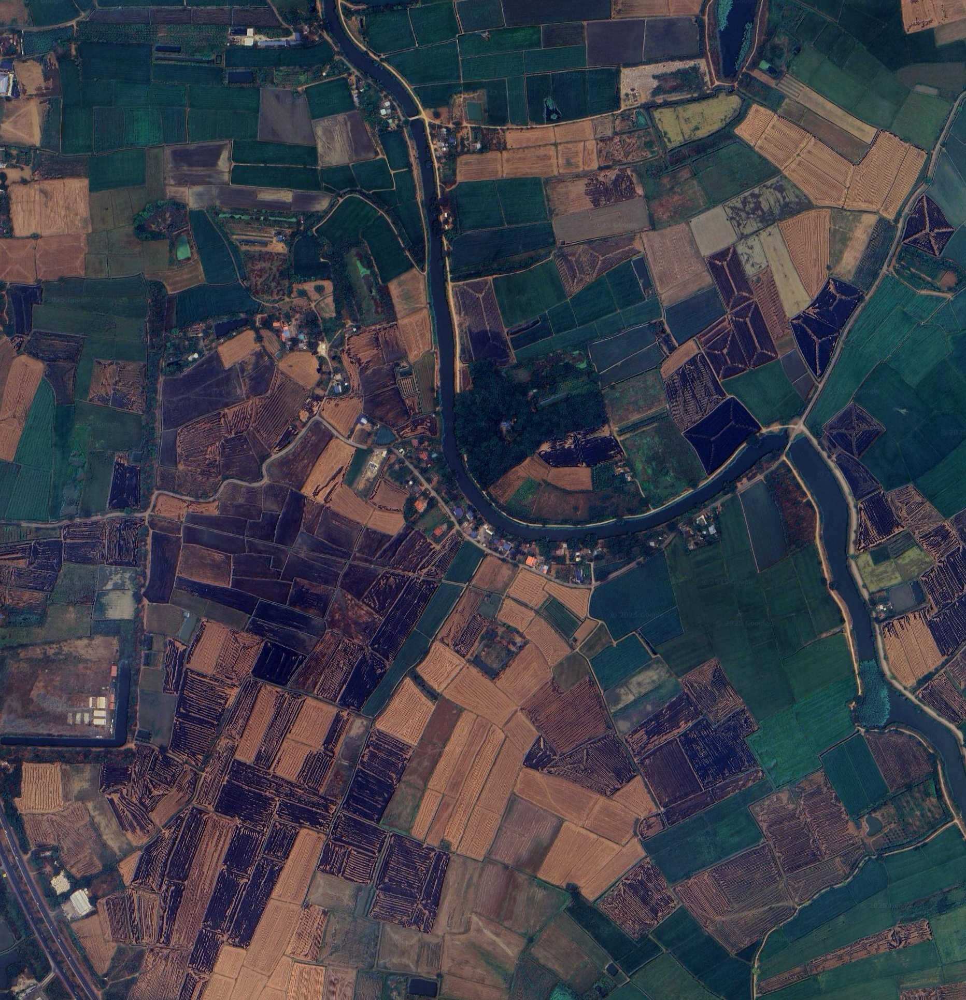
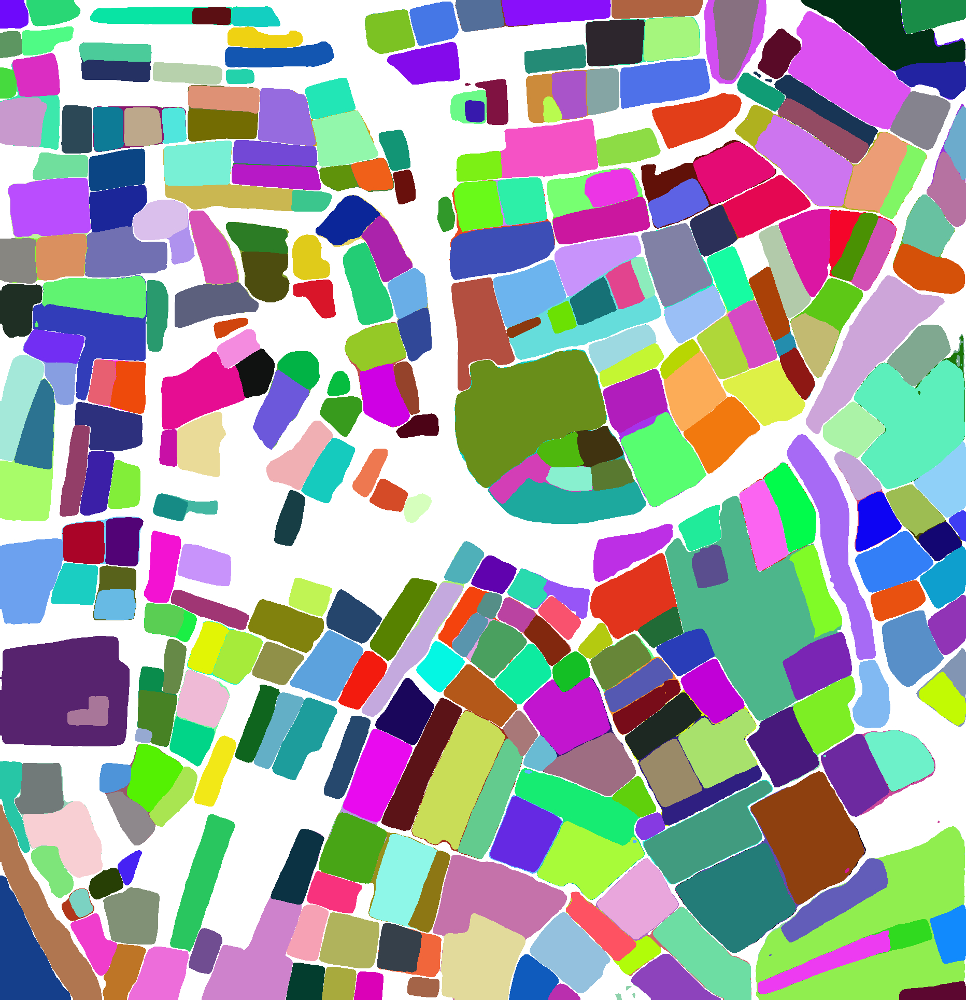

In [ ]:
leafmap.image_comparison(
    "satellite.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

Add image to the map.

In [ ]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=1922935.0, center=[14.819428, 100.45784], controls=(ZoomControl(options=['position', 'zoom_in_text'…

Convert the object annotations to vector format, such as GeoPackage, Shapefile, or GeoJSON.

In [ ]:
sam.tiff_to_vector("masks.tif", "masks.gpkg")

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

In [ ]:
sam.generate(image, output="masks2.tif", foreground=True)

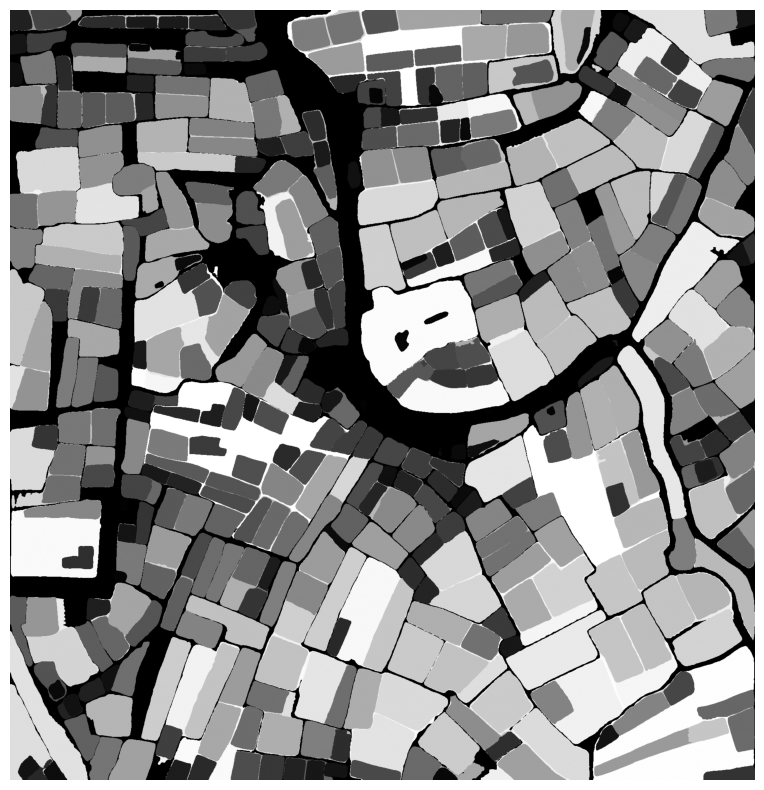

In [ ]:
sam.show_masks(cmap="binary_r")

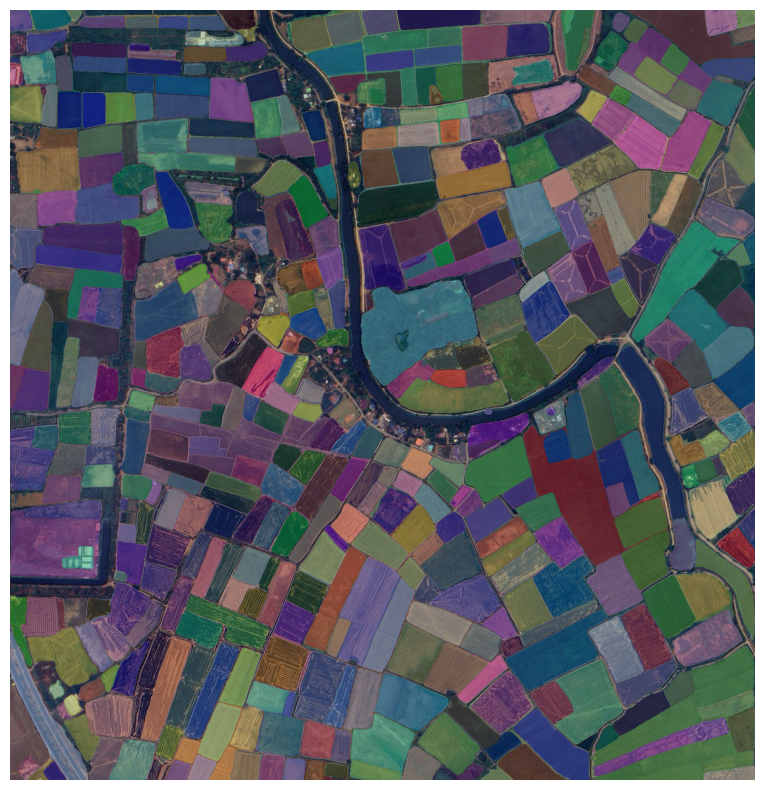

In [ ]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")

Compare images with a slider.


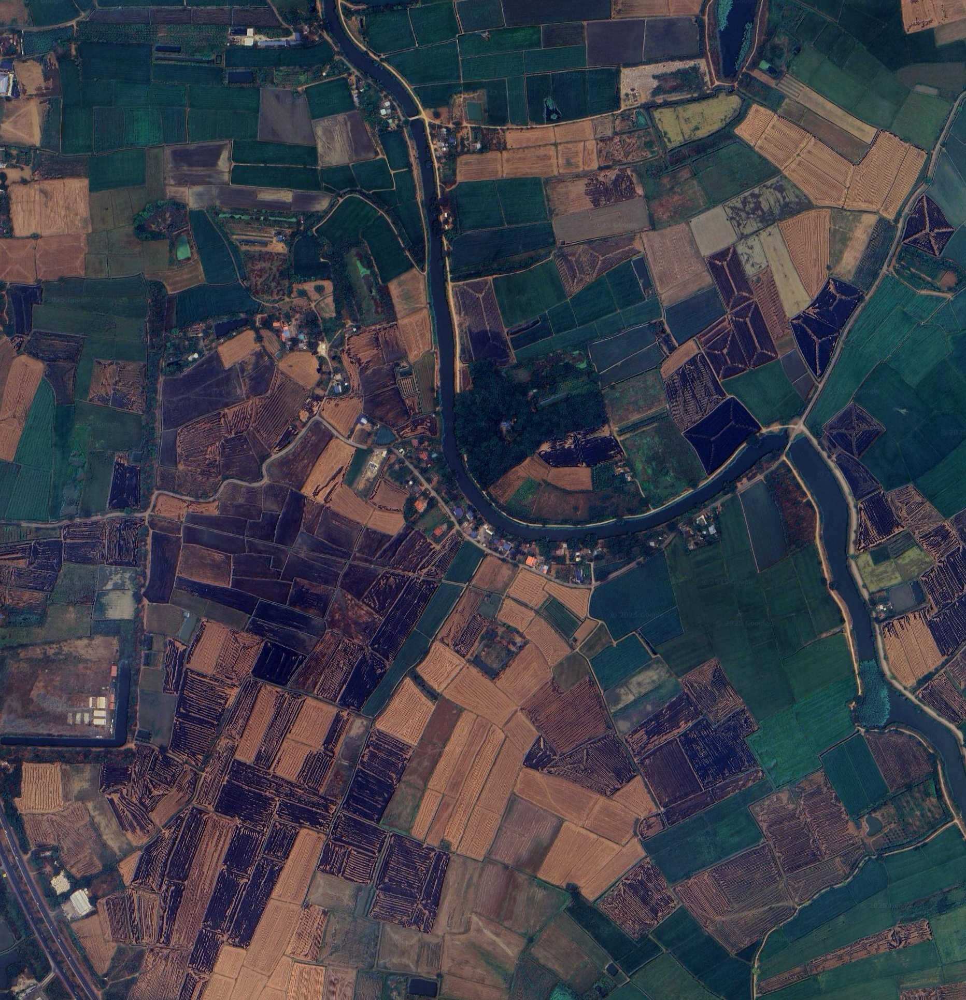
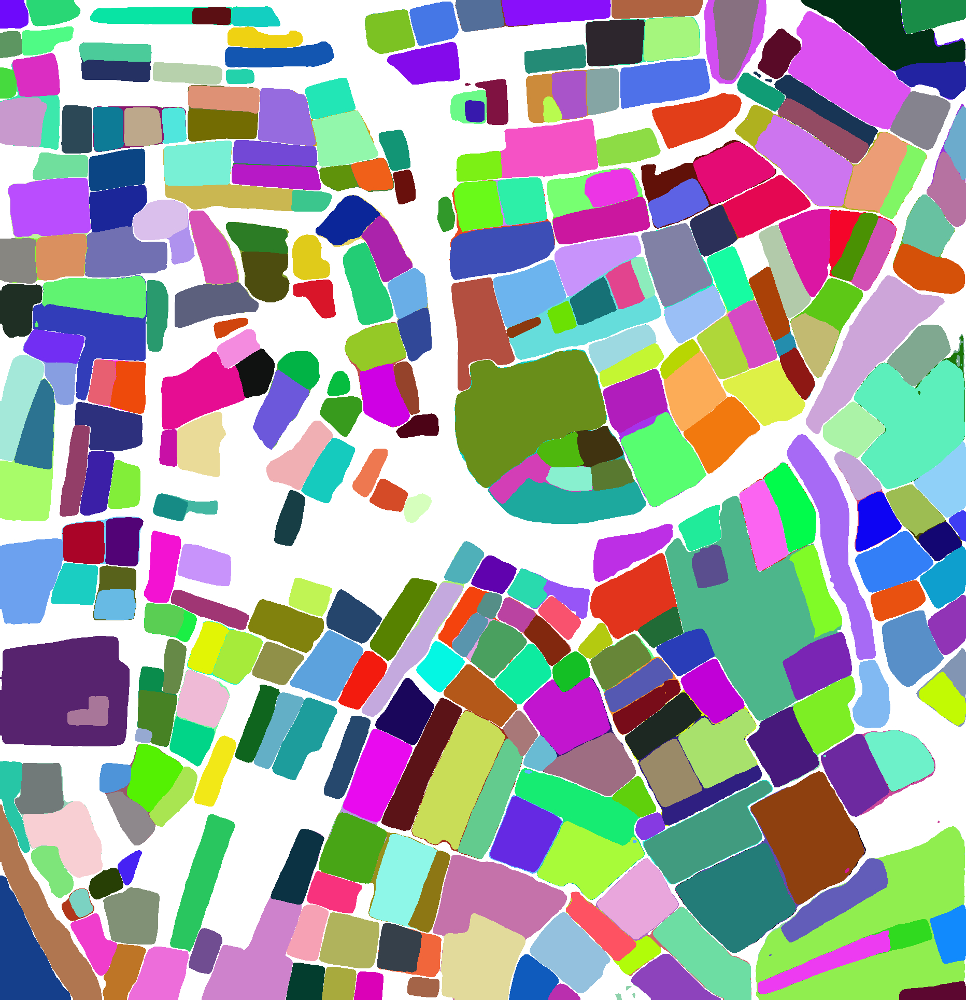

In [ ]:
leafmap.image_comparison(
    image,
    "annotations.tif",
    label1="Image",
    label2="Image Segmentation",
)

**📝 คำถามท้าย Lab (ให้นักศึกษาเขียนตอบใน cell markdown):**


1. พื้นที่ที่คุณเลือกคือบริเวณใด และมีลักษณะอย่างไร?

   - พื้นที่ที่เลือกคือ ตำบลบ้านแป้ง อำเภอเมืองสิงห์บุรี จังหวัดสิงห์บุรี ซึ่งตั้งอยู่บริเวณภาคกลางของประเทศไทย โดยมีพิกัดศูนย์กลางประมาณ 14.8194,100.4578 ลักษณะพื้นที่ส่วนใหญ่เป็นพื้นที่เกษตรกรรม เช่น นาข้าว และมีชุมชนขนาดเล็กกระจายอยู่ในบางจุด สภาพแวดล้อมเป็นพื้นที่ราบลุ่ม มีคลองหรือแหล่งน้ำธรรมชาติไหลผ่าน เหมาะสำหรับการทดสอบการแยกวัตถุจากภาพถ่ายดาวเทียม เนื่องจากสามารถแยกแยะวัตถุได้ชัดเจน เช่น พื้นที่เพาะปลูก สิ่งปลูกสร้าง และแหล่งน้ำ

---





2. SAM สามารถแยกวัตถุใดได้ชัดเจน? วัตถุใดไม่ชัดเจน?

  - SAM สามารถแยกวัตถุที่มีขอบเขตชัดเจนและแตกต่างจากพื้นหลังได้ดี เช่น อาคาร ถนน และพื้นที่ที่มีความหลากหลาย แต่จะไม่สามารถแยกวัตถุที่มีลักษณะคล้ายคลึงกันหรือซับซ้อนได้ดี เช่น พื้นที่เกษตรกรรมที่มีพืชพันธุ์เดียวกันจำนวนมาก หรือวัตถุที่ขอบเบลอและทับซ้อนกัน เช่น เมฆหรือเงา


---


3. คิดว่า SAM มีข้อจำกัดอะไรในการใช้งานกับภาพถ่ายดาวเทียม?
   
   - ข้อจำกัดของ SAM ในการใช้งานกับภาพถ่ายดาวเทียม คือ ภาพที่มีความละเอียดต่ำอาจทำให้ SAM ไม่สามารถแยกวัตถุที่มีขนาดเล็กหรือรายละเอียดต่ำได้อย่างแม่นยำ และการทับซ้อนของวัตถุหรือการสะท้อนแสงจากสภาพแวดล้อมอาจทำให้การแยกวัตถุในภาพดาวเทียมยากขึ้น

---



4. คุณจะปรับปรุงผล segmentation นี้อย่างไรถ้ามีเวลามากขึ้น?

   - หากมีเวลามากขึ้น การปรับปรุงผล segmentation สามารถทำได้โดยการใช้ข้อมูลเสริมจากแหล่งต่างๆ เช่น ข้อมูลเซ็นเซอร์หรือข้อมูลภูมิศาสตร์ การฝึกโมเดลกับภาพจากหลายแหล่ง และการปรับแต่งอัลกอริธึมเพื่อจัดการกับกรณีที่มีขอบเบลอหรือทับซ้อน รวมถึงการใช้เทคนิค post-processing เพื่อปรับเส้นขอบให้ชัดเจนยิ่งขึ้น